In [30]:
import warnings

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

import nltk
from bs4 import BeautifulSoup
from gensim.models import word2vec
from sklearn.manifold import TSNE

### Loading the Dataset

In [9]:
# Read in data into pandas dataframe
df = pd.read_json('data/hacker_news_sample.json', lines=True, orient='records', convert_dates='time')
df.head()

,author,by,dead,deleted,id,parent,ranking,text,time,time_ts
0,13,13,NaN,NaN,9432701,9432687,0,You can spent hours making a very large effigy...,1429877151,1429877151
1,13,13,NaN,NaN,8557403,8557328,0,"You&#x27;d think nothing, but people have fail...",1415118745,1415118745
2,5h,5h,NaN,NaN,3991908,3991512,0,This legislation makes me die a little inside ...,1337350335,1337350335
3,99,99,NaN,NaN,5811330,5810364,0,Green card/ H1B sponsoring?,1370232744,1370232744
4,Iv,Iv,NaN,NaN,7792903,7790738,0,Thanks a lot. It is annoying that we can&#x27;...,1400918963,1400918963


## Cleaning the Dataset

In [10]:
# Drop unnecessery and irrelevant columns
df = df.drop(columns=['dead', 'deleted', 'ranking', 'id', 'parent'])

# Drop duplicates
df = df.drop(columns=['time_ts', 'by'])

# Convert time to datetime
df['time'] = pd.to_datetime(df['time'], unit='s')
df.head()

,author,text,time
0,13,You can spent hours making a very large effigy...,2015-04-24 12:05:51
1,13,"You&#x27;d think nothing, but people have fail...",2014-11-04 16:32:25
2,5h,This legislation makes me die a little inside ...,2012-05-18 14:12:15
3,99,Green card/ H1B sponsoring?,2013-06-03 04:12:24
4,Iv,Thanks a lot. It is annoying that we can&#x27;...,2014-05-24 08:09:23


# An Overview of Preprocessing Steps

Preprocessing is vital to ensure an effective text analysis, some common preprocessing steps can be summarised as below:

+ Extracting text from DOM elements / removing HTML tags
+ Removing URLs
+ Removing stopwords (extremely common words)
+ Converting all letters to lower or upper case
+ Standardize white space
+ Removing punctuation and special characters
+ Removing accent marks and other diacritics
+ Converting digits to words
+ Expanding abbreviations
+ Correcting repeating characters (no vs. noooo)
+ Correcting misspelled words

In [11]:
text_without_tags = list()

# Iterate over dataframe rows
for row in df.itertuples(index=True, name='Pandas'):
    soup = BeautifulSoup(getattr(row, "text"))
    article = ''
 
    # Select and extract text from all tags
    # Remove links
    web_links = soup.find_all('a')
    for link in web_links:
        link.replace_with('')
        
    paragraphs = soup.find_all('p')
    for paragraph in paragraphs:
        article += paragraph.get_text()
    
    text_without_tags.append(article)
    print(soup.prettify())
    print("\n")
    print(article)
    print("\n")

<html>
 <body>
  <p>
   You can spent hours making a very large effigy of your rival depicted as a phallus with gold trim and rubies: being a work of art doesn't make it any less unprofessional.
  </p>
 </body>
</html>


You can spent hours making a very large effigy of your rival depicted as a phallus with gold trim and rubies: being a work of art doesn't make it any less unprofessional.


<html>
 <body>
  <p>
   You'd think nothing, but people have failed attempting to prove this before.
  </p>
  <p>
   &gt; "But Clarkson admitted he was "wrong" after he discovered a reader had used the details to create a £500 direct debit to the charity Diabetes UK."
  </p>
  <p>
  </p>
 </body>
</html>


You'd think nothing, but people have failed attempting to prove this before.> "But Clarkson admitted he was "wrong" after he discovered a reader had used the details to create a £500 direct debit to the charity Diabetes UK."


<html>
 <body>
  <p>
   This legislation makes me die a little inside e

<html>
 <body>
  <i>
   ..sounds like security through obscurity to me.
  </i>
  <p>
   That sounds like you are echoing something you heard once without understanding the reasoning behind it.
  </p>
  <p>
   <i>
    security through obscurity
   </i>
   usually doesn't make sense WRT computer security because the attacks the computer systems are often subject to are sustained for long periods and can't be stopped (think of someone downloading your software to attack it).
  </p>
  <p>
   In a military situation you do have the capability to retaliate and/or reinforce. This changes the situation because it makes
   <i>
    time
   </i>
   a critical factor. In that case, obscurity makes a
   <i>
    lot
   </i>
   of sense because it slows down the attacker. When you have the ability to change things yourself
   <i>
    anything
   </i>
   that slows down the attack is useful.
  </p>
  <p>
   This applies to computer security too - if you can detect an attack, then anything that stops t

<html>
 <body>
  <p>
   &gt;I just wanted to point out that GPS logging is entirely passive
  </p>
  <p>
   This is not entirely true, for example:
  </p>
  <p>
   It appears that many, if not all GPS devices use superheterodyne receiver as well.
  </p>
 </body>
</html>


>I just wanted to point out that GPS logging is entirely passiveThis is not entirely true, for example: It appears that many, if not all GPS devices use superheterodyne receiver as well.


<html>
 <body>
  <p>
   You. are. evil.
  </p>
  <p>
   You just reddit-bombed me and who knows how many HN'ers. 30 minutes gone and counting.
  </p>
 </body>
</html>


You. are. evil.You just reddit-bombed me and who knows how many HN'ers. 30 minutes gone and counting.


<html>
 <body>
  <p>
   It works in FF 3.6 on Mac.
  </p>
 </body>
</html>


It works in FF 3.6 on Mac.


<html>
 <body>
  <p>
   (The reason why manhole covers are round is obvious - because manholes are round (which also happens to have additional benefit of not 

<html>
 <body>
  <p>
   I totally agree!!! But let us NOT forget that the topic being discussed is the lack of women in programming &amp; IT, not in CS or Math!
  </p>
  <p>
   I said there's no math in programming, which is not entirely accurate because some algorithms and stuff can be considered math. But still, let us keep in mind that HN is populated with über-hackers, the kind of people who are genuinely intelectually curious and learn stuff on their own. Thus, we discuss AI, ML and NLP here on HN often. But let us keep in mind that 90% or more of the programmers in this world are coding monkeys who don't care about elegant code and intellectual pursuits, they care about a pay check and going home before 19:00. Am I wrong?
  </p>
 </body>
</html>


I totally agree!!! But let us NOT forget that the topic being discussed is the lack of women in programming & IT, not in CS or Math!I said there's no math in programming, which is not entirely accurate because some algorithms and stuff 

</html>


Yes, vs RC4-SHA.There's always five bytes of record header: the record type, u16 length and u16 version. (The version is basically a waste.)For AES-CBC there's an average of 8 bytes of padding (half the block size).For AES-GCM there's eight bytes of wasted nonce because of FIPS concerns that appear to have been groundless.Then there's the MAC: 20 bytes for HMAC-SHA1 or 16 for GCM or Poly1305.


<html>
 <body>
  <p>
   Written by the EPSU, from the last page:
  </p>
  <p>
   EPSU is the European Federation of Public Service Unions. It is the largest federation of the ETUC and comprises 8 million public service workers from over 275 trade unions; EPSU organises workers in the energy, water and waste sectors, health and social services and local and national administration, in all European countries including in the EU’s Eastern Neighbourhood.
  </p>
 </body>
</html>


Written by the EPSU, from the last page:EPSU is the European Federation of Public Service Unions. It is the lar

</html>


The problem description did say:


<html>
 <body>
  <p>
   May be the link that was submitted:
  </p>
  <p>
  </p>
 </body>
</html>


May be the link that was submitted:


<html>
 <body>
  <p>
   PHP has built in support for ebcdic. It's bigger than nix.
  </p>
 </body>
</html>


PHP has built in support for ebcdic. It's bigger than nix.


<html>
 <body>
  <p>
   Sure, but that feature seems trivial to me, I can simply create a view in my database to shake the data however I would like.
  </p>
  <p>
  </p>
  <p>
   I could just select * from viewGroupErrors where error=12345
  </p>
  <p>
   The cost of this app should be less than cost of my time to make it, right now the yearly cost is probably $50 to me.
  </p>
 </body>
</html>


Sure, but that feature seems trivial to me, I can simply create a view in my database to shake the data however I would like.I could just select * from viewGroupErrors where error=12345The cost of this app should be less than cost of my time to mak

</html>


So the lambda functions are implemented in a way that only really works with templates and you have to explicitly pass scope? I don't really write C++ "natively," but this seems awkward to me, particularly vis-a-vis Apple's implementation of blocks in C. Does it look better to anyone who has a better handle on the feel of idiomatic C++?


<html>
 <body>
  <p>
   "Human nature" is neither an explanation nor a motive; it's a punt. I am also human, but I did not do this. I have been a dick now and then, but I never stole a rare water lily. These pseudo-pithy explanations are about as useful as answering the question "What causes things to fall when you drop them?" with "TLDR: It's natural that when you drop things, they fall. Nothing new to report."
  </p>
  <p>
   We all know that humans do lousy things, but there are usually specific reasons beyond "human nature" why they do them.
  </p>
 </body>
</html>


"Human nature" is neither an explanation nor a motive; it's a punt. I a

<html>
 <body>
  <p>
   Many people are on the complete opposite side of the spectrum. I personally believe that autonomous vehicles are undoubtedly the future. They'll save an enormous amount of lives, allow new businesses to be created, eliminate the need for a drivers license (bye DMV), reduce insurance costs, and allow people to work, socialize, and actually have meals in vehicles (can turn the seats around and put a table in the middle). There are probably dozens of advantages that I missed in this post, but I don't see any reason to not aggressively pursue this technology.
  </p>
 </body>
</html>


Many people are on the complete opposite side of the spectrum. I personally believe that autonomous vehicles are undoubtedly the future. They'll save an enormous amount of lives, allow new businesses to be created, eliminate the need for a drivers license (bye DMV), reduce insurance costs, and allow people to work, socialize, and actually have meals in vehicles (can turn the seats arou

</html>


the point of adding a salt to the passwords is not to make decrypting the individual passwords harder - the salts are kept in plaintext - but to make it impossible to prevent the use of rainbow tables. that is, having longer salts will only make it harder for finding out all the people with the same password.


<html>
 <body>
  <p>
   Sure -- no argument there: for any population, there will exist individuals who can market themselves at extraordinary rates.
  </p>
  <p>
   I was interpreting the post as a statement of the average market rate, which is something else entirely.
  </p>
 </body>
</html>


Sure -- no argument there: for any population, there will exist individuals who can market themselves at extraordinary rates.I was interpreting the post as a statement of the average market rate, which is something else entirely.


<html>
 <body>
  <p>
   I understand the money-and-art-dont-mix vibe that I suspect you're coming from. But I don't think there is a conflict betwee

</html>


That's like asking a marathon runner why he doesn't just hop in a car.I use many languages.  I use C# to knock out a GUI.  VBA for a bit of spreadsheet work.  Q/KDB+ for database/functional work.  R for stats.  All of these are far more productive than C++.  If you want fancy abstractions, other languages have them by the bucketload.I don't use C++ to be productive, and I don't expect to be.  I use it to get close to the metal and have full control.  Everything you code will take 4-5 times longer to write.  And longer to compile.  You will be careful because you have to be careful, and that's a good thing because with that care comes quality.


<html>
 <body>
  <p>
   Sorry, missed that bit
  </p>
 </body>
</html>


Sorry, missed that bit


<html>
 <body>
  <p>
   Yeah, the plan is definitely to expand beyond Facebook in the medium term. It was just the fastest (though an imperfect) way of getting started and getting stellars into the hands of as many people as possible, as q

<html>
 <body>
  <p>
   Okay well guess I feel I have to respond to the "from a NZ perspective, we have to suffer for our art".  Yes, we do suffer as entrepreneurs in New Zealand (NZ).  But I disagree, I think the suffering is self inflicted.  An entrepreneur in NZ is up against structural problems and the cultural issues that make it unduly hard on us.  Please permit me to explain.
  </p>
  <p>
   The structural problems:
  </p>
  <p>
   IMHO the biggest problem isn't distance to global markets but a lack of capital gains tax on real estate which soaks up capital that could otherwise go to new ventures.  When I say that, I'm talking about the 3Fs... friends, fools and family.  Please don't get me started on the New Zealand Venture Investment Fund (NZVIF), the Seed Co-investment Fund and Kiwi Saver because these are band-aid solutions to the tax problem.  And forget about any solution to it.  Any political party/coalition that tries to do away with the no capital gains tax on real esta

<html>
 <body>
  <p>
   I'm the author of the linked article (and of the ViEmu products). Thank you guys for taking some time to read it.
  </p>
  <p>
   The funny thing is that having vi/vim editing inside Visual Studio is bringing in new converts:
  </p>
  <p>
  </p>
  <p>
  </p>
  <p>
   Of course I'm not impartial, but I would recommend you consider giving it a try if you have access to vi, vim, or emulation for them in your IDE (and some time).
  </p>
  <p>
   I miss having it in Firefox textareas (such as when typing this comment). I don't like using an external text editor for this - integration is everything to me. I'd happily pay for it, and I'm sure others would, too, although of course it's not a big market. Anyone up to the task?
  </p>
 </body>
</html>


I'm the author of the linked article (and of the ViEmu products). Thank you guys for taking some time to read it.The funny thing is that having vi/vim editing inside Visual Studio is bringing in new converts:Of course I'm 

<html>
 <body>
  <p>
   Ironicly I tend to find "undesigned", plain sites handle such things best.
  </p>
  <p>
   Doubly ironicly, TFA is not one of them, despite being just a plain piece of text. Fixed width is the tool of the devil.
  </p>
 </body>
</html>


Ironicly I tend to find "undesigned", plain sites handle such things best.Doubly ironicly, TFA is not one of them, despite being just a plain piece of text. Fixed width is the tool of the devil.


<html>
 <body>
  <p>
   &gt; At the end of the day, a soldier needs you to put food in him -- just like anyone else. That food comes from somewhere. It is scarce. It is not free.
  </p>
  <p>
   Sure, but a person needs food and clothing whether they're serving in the army or sitting around unemployed. Arguably the army can feed n people (who have to follow orders, show up at the mess hall at the same time and so on) more cheaply than those n people would by themselves.
  </p>
  <p>
   &gt; More broadly, though, the economy is about pr

<html>
 <body>
  <p>
   The bootstrap is not really hard when you've done it once, just jot it down somewhere.
  </p>
  <p>
   In my experience most people stumble because the network security in postgres is pretty tight by default.
  </p>
  <p>
   This is easily fixed and needs to be done only once.
  </p>
  <p>
   First: Find your pg_hba.conf. It's in the database-directory, that's often linked to /etc/postgresql.
  </p>
  <p>
  </p>
  <pre><code>  # Backup the original
  $ cp pg_hba.conf pg_hba.conf_orig

  # Now replace it with our desired security settings
  $ cat &gt;pg_hba.conf &lt;&lt;EOF
  # Require password auth from remote hosts
  # localhost and local socket are trusted
  host  all all 0.0.0.0/0 md5
  local all all trust
  host  all all 127.0.0.1/32 trust
  EOF

  # restart
  $ /etc/init.d/postgresql restart
</code></pre>
  From now on you can connect as
  <i>
   any
  </i>
  user from localhost without a password. Thus, we can now just go about our business.
  <p>
  </p>
 

<html>
 <body>
  <p>
   Palmer Luckey has stated that he has declined at least one buy out offer from a large company.
  </p>
 </body>
</html>


Palmer Luckey has stated that he has declined at least one buy out offer from a large company.


<html>
 <body>
  <p>
   Your personal data isn't going anywhere. The server is only used for establishing the connection when clients are behind NATs (which in today's environment you usually always are). If I understand WebRTC correctly, once the link is established, all communication is peer to peer.
  </p>
 </body>
</html>


Your personal data isn't going anywhere. The server is only used for establishing the connection when clients are behind NATs (which in today's environment you usually always are). If I understand WebRTC correctly, once the link is established, all communication is peer to peer.


<html>
 <body>
  <p>
   I worked in Apple Retail through April of last year, and this was the specific policy advocated during training, with the 

<html>
 <body>
  <p>
   The rejection letters at the interview stage have often included detailed feedback.  It's rejection in the earlier stage (not getting an interview, based on your application) which doesn't get detailed feedback (usually; I've seen some cases where it did, usually after questions in email).
  </p>
 </body>
</html>


The rejection letters at the interview stage have often included detailed feedback.  It's rejection in the earlier stage (not getting an interview, based on your application) which doesn't get detailed feedback (usually; I've seen some cases where it did, usually after questions in email).


<html>
 <body>
  <p>
   He's fundamentally a nerd, and optimistic about humanity.  That's enough to be better than 95% of people in power.
  </p>
 </body>
</html>


He's fundamentally a nerd, and optimistic about humanity.  That's enough to be better than 95% of people in power.


<html>
 <body>
  <p>
   VHF (2m) is going to be vastly more useful for emergency com

<html>
 <body>
  <p>
   I don't think many people really
   <i>
    are
   </i>
   doing jobs they don't like.  When you genuinely don't like
   <i>
    the work
   </i>
   , you quit.  Even people who are making a primarily economic decision simply do not stay in jobs they hate.
  </p>
  <p>
   I've yet to hear someone say they hate their job and then discover that they actually dislike the work itself.
Rather, what they hate are corporate pressures, co-workers and other external forces that impede their ability to do their job.
  </p>
  <p>
   When people feel they have control over those factors, they minimize them.  When they
   <i>
    don't
   </i>
   , it creates the stress that leads to 'I hate my job'.
  </p>
 </body>
</html>


I don't think many people really are doing jobs they don't like.  When you genuinely don't like the work, you quit.  Even people who are making a primarily economic decision simply do not stay in jobs they hate.I've yet to hear someone say they hate the

<html>
 <body>
  <p>
   Definitely if you're a slacks-wearing corporate stooge middle manager, you'd rather work in an office park with a linoleum cafeteria and acres of parking. To remind yourself every day that you're not exceptional.
  </p>
 </body>
</html>


Definitely if you're a slacks-wearing corporate stooge middle manager, you'd rather work in an office park with a linoleum cafeteria and acres of parking. To remind yourself every day that you're not exceptional.


<html>
 <body>
  <p>
   It would be nice, but as we show the person twitter timeline we can't do that without you being logged in otherwise we can be out of quota (2000req/hour)
  </p>
 </body>
</html>


It would be nice, but as we show the person twitter timeline we can't do that without you being logged in otherwise we can be out of quota (2000req/hour)


<html>
 <body>
  <p>
   That doesn't really contradict his point. It's all about probabilistic expectation. Presumably you have a myriad of options to choose from

<html>
 <body>
  <p>
   Because the box saves the ISP more money than its hosting costs.
  </p>
 </body>
</html>


Because the box saves the ISP more money than its hosting costs.


<html>
 <body>
  <p>
   Dupe:
  </p>
 </body>
</html>


Dupe: 


<html>
 <body>
  <p>
   To be clear, this does not run software in the browser; it runs software in the cloud and displays it in the browser. Given the possibility of actually running apps in the browser I think this distinction matters.
  </p>
 </body>
</html>


To be clear, this does not run software in the browser; it runs software in the cloud and displays it in the browser. Given the possibility of actually running apps in the browser I think this distinction matters.


<html>
 <body>
  <p>
   I'm betting this has to do with color correction.
  </p>
  <p>
  </p>
 </body>
</html>


I'm betting this has to do with color correction.


<html>
 <body>
  <p>
   You missed the part where almost every Windows app breaks at high DPI.
  </p>
 </bod

<html>
 <body>
  <p>
   Answer: Maybe in 6 years, and even then not so much. The author here plays very fast and loose with the figures. The claim about h.265 encoded 720p video vs. h.264 encoded video is particularly egregious. From the article:
  </p>
  <p>
   "For example, a 720p movie transmitting in HEVC will only require 600 Kbps to crisply stream, a connection speed drastically lower than the current average of 4.5 Mbps."
  </p>
  <p>
   Utter nonsense. The statement is phrased so it appears that they are comparing the same video quality, when in reality, the best h.265 encoders will probably only reduce 720p file size (for a given quality) by around 30% vs. x264 encoded h.264.
  </p>
  <p>
   I do at least applaud the author for mentioning that hardware decoder support is a ways off, but the citations he offers for actual decoder support are very light on details. I seriously doubt we'll see hardware h.265 decoding support in even half of newly marketed devices 2 years from now

</html>


Ah, the good old two-wrongs-make-a-right school of morality.


<html>
 <body>
  <p>
   That doesn't imply the top 1% isn't there; just that they are more likely to be under-represented.  Also, programmers are prone to move to new areas that are more interesting, especially the top/best, so that can skew it back in favor of the upper echelons.  It always seems that the mid range to bottom developers are more likely to find somewhere and stay, as they have so much trouble finding a new place to go to.  They are the ones that have 'stickyness'.
  </p>
  <p>
   What is the biggest factor, from what I can tell, is that the best don't send out their resumes but get poached by other companies or use their networking to land a job.
  </p>
 </body>
</html>


That doesn't imply the top 1% isn't there; just that they are more likely to be under-represented.  Also, programmers are prone to move to new areas that are more interesting, especially the top/best, so that can skew it back in f

<html>
 <body>
  <p>
   VHDL has the same problem:
  </p>
  <p>
  </p>
  <pre><code>  signal x, y: std_logic;
  ...
  x &lt;= 'X';
  ...
  y &lt;= '0' when x = '0' else '1';
</code></pre>
  will result in
  <i>
   y
  </i>
  getting the value '1' in simulation, but you don't know what it'll be for synthesis. So if you're unlucky, it'll simulate correctly but fail in hardware. Which is exactly what simulation should protect you from.
  <p>
   And even if you assign only '0' and '1', you might get an 'X' from third-party IP cores.
  </p>
 </body>
</html>


VHDL has the same problem:And even if you assign only '0' and '1', you might get an 'X' from third-party IP cores.


<html>
 <body>
  <p>
   "Ever" is a very strong word for a technological project which doesn't contradict any known natural laws. Do you honestly not see the possibility that we might be able to build a self-sustaining, comfortable colony on Mars in 100 years? 500? 1000?
  </p>
 </body>
</html>


"Ever" is a very strong 

<html>
 <body>
  <p>
   If they copied HTML code, or graphics, then sure. But if they looked at the site and incorporated similar elements and wording, which seems to be what happened, I'd say "meh - it happens".
  </p>
  <p>
   IMHO not getting the .com is a really bad idea. The best case scenario is you start paying adwords a ton of money to get the traffic. Worst case is probably what happened here.
  </p>
 </body>
</html>


If they copied HTML code, or graphics, then sure. But if they looked at the site and incorporated similar elements and wording, which seems to be what happened, I'd say "meh - it happens".IMHO not getting the .com is a really bad idea. The best case scenario is you start paying adwords a ton of money to get the traffic. Worst case is probably what happened here.


<html>
 <body>
  <p>
   So just make more touchscreen laptops.
  </p>
  <p>
   A tablet is just irritating because it cant stand up on its own.
  </p>
 </body>
</html>


So just make more touchscreen l

<html>
 <body>
  <p>
   Assuming names and other identifying details were omitted, would you think it's fine for a company to blog about every candidate they interviewed?
  </p>
 </body>
</html>


Assuming names and other identifying details were omitted, would you think it's fine for a company to blog about every candidate they interviewed?


<html>
 <body>
  <p>
   The Googles lead me to Amish Friendship Bread, which requires a starter that you have to get from someone else.  Thus, without the starter you can't compile your bread from sources.  At least, that's the best I can come up with in three minutes.  :)
  </p>
 </body>
</html>


The Googles lead me to Amish Friendship Bread, which requires a starter that you have to get from someone else.  Thus, without the starter you can't compile your bread from sources.  At least, that's the best I can come up with in three minutes.  :)


<html>
 <body>
  <p>
   This one makes my display shimmer a little:
  </p>
 </body>
</html>


This one

<html>
 <body>
  <p>
   Failed to meet analyst expectations, which have never been right.
  </p>
  <p>
   Met Apple's own guidance, though. The stock is also now back up to ~$420
  </p>
 </body>
</html>


Failed to meet analyst expectations, which have never been right.Met Apple's own guidance, though. The stock is also now back up to ~$420


<html>
 <body>
  <p>
   Well if manually managed memory allocated through the FFI is unacceptable to you for some reason you are out of luck indeed. Well, the limit is per process but I guess distributing the task across multiple processes is not acceptable either.
  </p>
  <p>
   By the way, it is worth pointing out that Mike Pall (LuaJIT's author) has said that the current Lua garbage collector is not designed to handle such big heaps efficiently anyway.
  </p>
 </body>
</html>


Well if manually managed memory allocated through the FFI is unacceptable to you for some reason you are out of luck indeed. Well, the limit is per process but I guess 

<html>
 <body>
  <p>
   Idealy we should have profiles with location, url, short description and email address fields.
  </p>
  <p>
   If that doesnt happen then this cofounders meetup board would be good. Count me in. You can find me via danshub.com or contact me at dan@danshub.com.
  </p>
 </body>
</html>


Idealy we should have profiles with location, url, short description and email address fields. If that doesnt happen then this cofounders meetup board would be good. Count me in. You can find me via danshub.com or contact me at dan@danshub.com.


<html>
 <body>
  <p>
   Heres the text of the post, caught by my RSS reader. Looks like a repeat of the rumour going round during FOWA:
  </p>
  <p>
   <i>
    Some murmuring in the UK this this week says that Viacom is continuing its negotiations to buy Last.fm for approximately $450 million - a huge sum, but partly justified by the fact that Last.fm is really the ÂYouTube of musicÂ these days.
   </i>
  </p>
  <p>
   <i>
    The royal

<html>
 <body>
  <p>
   It's not that it's hard to remember, it's hard to type in. At least that's my experience (I use a few 16+ character passwords/passphrases). It might be easier if it's all lower-case, no numbers etc -- I'm not sure -- I've not tested myself.
  </p>
  <p>
   But in writing the above, I had to hit backspace at least once -- something that's a bit hard to catch when you're typing blind into a password entry field, like when typing in the pass-phrase for unlocking a LUKS partition, or logging into a console session. Or even typing in a login password in a graphical login manager, like the windows login prompt, or gdm/ldm/xdm etc.
  </p>
  <p>
   And it also takes time. Especially if you only get it right on your third attempt.
  </p>
 </body>
</html>


It's not that it's hard to remember, it's hard to type in. At least that's my experience (I use a few 16+ character passwords/passphrases). It might be easier if it's all lower-case, no numbers etc -- I'm not sure -- I

<html>
 <body>
  <p>
   We are stuck with NoSQL in HTML5, because Mozilla and Microsoft refuse to implement WebSQL (
   )
  </p>
  <p>
   IndexedDB is fine for storing JSON objects, etc. but a relational database with SQL query syntax, indexes, etc. more powerful and means less code to write. With IndexedDB one has to reinvent the wheel to just get basic query features.
  </p>
  <p>
   WebSQL is not deprecation, the W3C Working Group Note actually says:
  </p>
  <p>
  </p>
  <pre><code>  'This specification is no longer in active maintenance 
  and the Web Applications Working Group does not intend to 
  maintain it further'.
</code></pre>
  WebSQL is only available in Webkit based Browsers (Safari, Chrome) which means most mobile browsers.
As SQLite is in public domain, no company would "loose their face" if they choose to use it. They could fork off SQLite and change the SQL query syntax (parser) to whatever the W3C finds suitable.
  <p>
   Mozilla Firefox and FirefoxOS both already 

<html>
 <body>
  <p>
   As a non-leftist who moves in academic circles, I have to say it's still very difficult. Even in the hard sciences, I find that every social gathering I go to winds up turning into a classic left-wing whine-about-everything, and I have to bite my tongue. More than once I've wanted to get out of academia, just because the lack of intellectual diversity was getting too much for me. And that's leaving aside the direct hostility which I have encountered when I've actually made my views known (which I've avoided doing at the couple of places I've worked most recently).
  </p>
  <p>
   Of course, it's a vicious circle. If I'm thinking of leaving due to the hostile environment, then surely other non-leftist academics are actually leaving, keeping the environment hostile.
  </p>
  <p>
   As is usually the case in a New York Times "let's collect a couple of anecdotes and extrapolate a huge trend" articles, the data doesn't back up the conclusions.
  </p>
 </body>
</html>

<html>
 <body>
  <p>
   POVRay is a compiler. It takes a specification of a scene graph (give or take some details), and emits an image.
  </p>
  <p>
   A JSON library is two compilers. One takes text and emits some form of language-specific representation, the other takes the language-specific representation and emits text. Serialization in general is a special case of a compiler.
  </p>
  <p>
   A syntax highlighter is a compiler. One end of it looks like a normal language compiler, but it doesn't emit machine code, it emits annotated text. There are some fun intricacies related to that that have little relevant to conventional compilers, in fact:
  </p>
  <p>
   A web browser is a compiler. (Actually it's rather a lot of compilers.) It takes a web page and compiles it into the necessary set of instructions for the local display library to correctly display the page.
  </p>
  <p>
   It is absolutely feasible to be an "expert on compilers" who doesn't know dick all about stack layouts

<html>
 <body>
  <p>
   Math is hard and sucks because we are forced to do tedious and time consuming calculations by hand. Even with a calculator, it's still painful.
  </p>
  <p>
   I basically cringe at khanacademy everytime they forced me to do this.
  </p>
 </body>
</html>


Math is hard and sucks because we are forced to do tedious and time consuming calculations by hand. Even with a calculator, it's still painful.I basically cringe at khanacademy everytime they forced me to do this.


<html>
 <body>
  <i>
   I'm not very convinced. The excitement about bitcoin now is that seems like a semi-mainstream alternative payment system. And a big part of that is that it seems legal in the first place.
  </i>
  <p>
   I need to write an article on
   <i>
    kitty activism
   </i>
   and other ways to allow bitcoin to thrive.
  </p>
 </body>
</html>


I need to write an article on kitty activism and other ways to allow bitcoin to thrive.


<html>
 <body>
  <p>
   I trust replications more

<html>
 <body>
  <p>
   Very cool... Xapian, Sphinx and Hyper Estraier support should be coming soon:
  </p>
 </body>
</html>


Very cool... Xapian, Sphinx and Hyper Estraier support should be coming soon: 
   


<html>
 <body>
  <p>
   Spot on. I'll keep working with this attitude, that any outcome will be positive, and work toward MVP while most other concerns can wait. This brought me back to thinking clearly.
  </p>
 </body>
</html>


Spot on. I'll keep working with this attitude, that any outcome will be positive, and work toward MVP while most other concerns can wait. This brought me back to thinking clearly.


<html>
 <body>
  <p>
   I find that most are moving towards laptops (mbp) with external monitors.
  </p>
 </body>
</html>


I find that most are moving towards laptops (mbp) with external monitors.


<html>
 <body>
  <p>
   The US conventional wisdom is that diesels are big, very dirty truck engines.  The small turbodiesel is not a thing that made much headway here outside

<html>
 <body>
  <p>
   And it's back! Though I'd be hesitant to make any purchases, considering how fickle the site's performance is at the moment.
  </p>
 </body>
</html>


And it's back! Though I'd be hesitant to make any purchases, considering how fickle the site's performance is at the moment.


<html>
 <body>
  <p>
   Automatically generated tribute songs based on the likes of the deceased. Plugged in with facebook to provide images and generating a tribute video with audio and video. Build it as an online service for sending sympathy e-cards.
  </p>
 </body>
</html>


Automatically generated tribute songs based on the likes of the deceased. Plugged in with facebook to provide images and generating a tribute video with audio and video. Build it as an online service for sending sympathy e-cards.


<html>
 <body>
  <p>
   I also use a Mac and despite all the criticism, I'm pleased with the one window interface. My biggest gripe with the OSX version is its increased memory usage.
Al

<html>
 <body>
  <p>
   Yeah, that's certainly what he sounded like here (though I'm sure he's a great guy -- we've all got our soapboxes).  I stopped reading after this:
  </p>
  <p>
   "
   <i>
    I have no fucking idea where the hard drive is in my MacBook Pro, and even if you drew me a damn diagram with labels and numbers and gave me a replacement drive I wouldn't open my machine even in exchange for a year with Zooey Deschanel.
   </i>
   "
  </p>
 </body>
</html>


Yeah, that's certainly what he sounded like here (though I'm sure he's a great guy -- we've all got our soapboxes).  I stopped reading after this:"I have no fucking idea where the hard drive is in my MacBook Pro, and even if you drew me a damn diagram with labels and numbers and gave me a replacement drive I wouldn't open my machine even in exchange for a year with Zooey Deschanel."


<html>
 <body>
  <p>
   That's an extremely misleading headline.  Settling a lawsuit is not the same as winning it.
  </p>
 </body>
</h

<html>
 <body>
  <p>
   It looks like it pulls data from the "backdrops" section on TMDb. See the movies.io page[0] for a movie and its corresponding[1] TMDB page. There's also a TMDb API method to get a list of all the relevant images in XML[2].
  </p>
  <p>
   [0]:
   [1]:
   [2]:
  </p>
 </body>
</html>


It looks like it pulls data from the "backdrops" section on TMDb. See the movies.io page[0] for a movie and its corresponding[1] TMDB page. There's also a TMDb API method to get a list of all the relevant images in XML[2].[0]: 
[1]: 
[2]: 


<html>
 <body>
  <p>
   I don't see much wrong with them, other than the new backwards scrolling, disappearing scrollbars and rubberbanding. I use the Magic Mouse, which to me feels pretty nice. The only trouble I have really had is that they're crap for gaming. Then again, I don't touch my mouse very often.
  </p>
 </body>
</html>


I don't see much wrong with them, other than the new backwards scrolling, disappearing scrollbars and rubberband

<html>
 <body>
  <p>
   I think the author's point is reasonable, that Medium attempts to act as a 'YouTube' for articles. However, I believe there are key differences at this point in Medium's evolution (I do believe they will change their model over time).
  </p>
  <p>
   For me, thinking writing an article, Medium offers the following: a possible readership/distribution (assuming I get picked up by editors), no long term commitments, no investment in set up (as opposed to a hosted personal blog), and little friction in posting.
  </p>
  <p>
   As an idea, having a streamlined essay posting &amp; sharing process seems good, however I think that Medium will need to address the following issues going forward:
  </p>
  <p>
   * Serious authors will eventually want to build their own identity/brand. I think much of posts in HN that criticise Medium comes down to this issue. When you write for Medium, you almost seem to detach yourself from the work. YouTube addresses this problem by offe

<html>
 <body>
  <p>
   Mercurial has the same ability to change history as git, it just doesn't make it the default workflow. The mq extension (Mercurial Queues) lets you pull existing changesets into a temporary queue, fold them, reorder them, etc. The rebase extension lets you rebase and the histedit extension lets you edit history in slightly different ways.
  </p>
  <p>
   All of these ship with Mercurial, but are turned off be default. Enabling them is just a matter of adding
  </p>
  <p>
  </p>
  <pre><code>    [extensions]
    mq = 
</code></pre>
  to your .hgrc file.
 </body>
</html>


Mercurial has the same ability to change history as git, it just doesn't make it the default workflow. The mq extension (Mercurial Queues) lets you pull existing changesets into a temporary queue, fold them, reorder them, etc. The rebase extension lets you rebase and the histedit extension lets you edit history in slightly different ways.All of these ship with Mercurial, but are turned off be de

<html>
 <body>
  <p>
   Quoting Sir Humphrey:  "Britain has had the same foreign policy objective for at least the last five hundred years: to create a disunited Europe. In that cause we have fought with the Dutch against the Spanish, with the Germans against the French, with the French and Italians against the Germans, and with the French against the Germans and Italians. Divide and rule, you see. Why should we change now, when it's worked so well?"
  </p>
 </body>
</html>


Quoting Sir Humphrey:  "Britain has had the same foreign policy objective for at least the last five hundred years: to create a disunited Europe. In that cause we have fought with the Dutch against the Spanish, with the Germans against the French, with the French and Italians against the Germans, and with the French against the Germans and Italians. Divide and rule, you see. Why should we change now, when it's worked so well?"


<html>
 <body>
  <p>
   Unless you also imply that other reliable currencies like AUD 

<html>
 <body>
  <p>
   And I even created a t-shirt from it!
  </p>
  <p>
   (look at the 3rd from the bottom)
  </p>
 </body>
</html>


And I even created a t-shirt from it! (look at the 3rd from the bottom)


<html>
 <body>
  <p>
   I am sure that AdWords works! and the reason we paused our campaigns is that I think it's better to spend time on writing articless because we don't have the time to put on AdWords. The worst thing is that I can't really outsource or contract someone to do it because they must know a lot about my niche.
  </p>
 </body>
</html>


I am sure that AdWords works! and the reason we paused our campaigns is that I think it's better to spend time on writing articless because we don't have the time to put on AdWords. The worst thing is that I can't really outsource or contract someone to do it because they must know a lot about my niche.


<html>
 <body>
  <i>
   I strongly believe that if the community reaffirms the core guidelines to the newer users
  </i>
  <p>

<html>
 <body>
  <p>
   DVD is a huge cocktail of patented technologies. You either license it properly or perish by the lawyers, that’s my understanding of it.
  </p>
 </body>
</html>


DVD is a huge cocktail of patented technologies. You either license it properly or perish by the lawyers, that’s my understanding of it.


<html>
 <body>
  <p>
   30 - For Linux users, learn how to use ip (and the tools included in iproute2) instead of using ifconfig, which is part of net-tools, they are deprecated.
  </p>
  <p>
   A good resource for that:
  </p>
  <p>
   45 - Use LVM always if it's possible.
  </p>
 </body>
</html>


30 - For Linux users, learn how to use ip (and the tools included in iproute2) instead of using ifconfig, which is part of net-tools, they are deprecated.A good resource for that: 45 - Use LVM always if it's possible.


<html>
 <body>
  <p>
   Sure there are ways to Apple amass a large user base with Ping, but I think it is hard to fight with the extensible, and relative

</html>


Oh, yes, sorry.  Thanks for pointing that out.I think that a sample size of 85 (89 marked parcels; 89 unmarked parcels; with 4 removed because of late response) is too small to really know much.And I think I'm a bit worried about the conclusions being drawn in this thread.


<html>
 <body>
  <p>
   How much of that is dollar value of the device and how much is the frustration of having to restore from backup and hoping the crypto is good enough that the thief just formats and reinstalls?
  </p>
 </body>
</html>


How much of that is dollar value of the device and how much is the frustration of having to restore from backup and hoping the crypto is good enough that the thief just formats and reinstalls?


<html>
 <body>
  <p>
   Non specific lower back pain used to be treated with bed rest and firmer mattresses.
  </p>
  <p>
   Now we know those are both bad things.  When you lie on your bed you want to be able to slide your hand, with a little bit of effort, under your spine 

</html>


No, it's entirely different actually.  A lot of applications hook into MobileMe to allow syncing, and don't offer any alternatives.Address Book, for example, plugs right in.  Sure, it's got Yahoo and Google syncing... but they break routinely, and I had to fight with it to not delete everything on both ends when I first hooked them up.  I'm now using Soocial to sync them because it was so buggy, and none of the options pass images back and forth.  Unless I'm forgetting something, MobileMe does, and it preserves all data correctly, unlike any option I've found.I believe iWeb also hooks in, letting you make changes to your site and push them out quickly.  As do iPhoto, iMovie, etc etc.  And when was the last time you could find your iPhone and / or wipe it if it was stolen with a 3rd party tool?Prior to Dropbox, what easy option was there aside from MobileMe?  And remember that all this happens behind the scenes, so you can't throw up dialog boxes ever, and still handle everyth

<html>
 <body>
  <p>
   Define "pet cause", I'm a random passerby. I happen to understand their argument as they intend it - rather than purposefully misrepresent it so that they are wrong.
  </p>
  <p>
   :::Edit (also TL;DR)
  </p>
  <p>
   This example doesn't match up because "Dogs are prone to heart conditions" would be the original argument, but I would need more context that was talking about Rottweilers and Dobermans to allow the meaning to be obvious, but the terminology used to be poor. My point here is to not get stuck on the words used - but the meaning
   <i>
    intended
   </i>
   behind them.
  </p>
  <p>
   :::End Edit
  </p>
  <p>
   Discussing the larger context when you've already delved into a specific context isn't merely nitpicking, it's intellectually dishonest. I'll give you a contrived example, albeit not an exact comparison of the current issue, to illustrate my point:
  </p>
  <p>
   Argument: "Rottweilers and Dobermans are prone to heart conditions."
  </p>

<html>
 <body>
  <p>
   "In this case, doing something less than usual is worth it: there's virtually no downside to upsetting a small Latin American country in the process. "
  </p>
  <p>
   Let's analyze this a bit further...
  </p>
  <p>
   Next time a British citizen holes up in the British embassy over some sham charges at the hands of the local police what are the likely aftershocks of Britain bullying Ecuador over Assange.
  </p>
 </body>
</html>


"In this case, doing something less than usual is worth it: there's virtually no downside to upsetting a small Latin American country in the process. "Let's analyze this a bit further...Next time a British citizen holes up in the British embassy over some sham charges at the hands of the local police what are the likely aftershocks of Britain bullying Ecuador over Assange.


<html>
 <body>
  <p>
   A better analogy might be to ask how much Wal-Mart marks up software in their store. The answer is more than Apple does.  Apple's value pr

</html>


The price is the risk that a random bad act like this may occur, not the sacrifice of a life.


<html>
 <body>
  <p>
   So someone abducted your cat, imprisoned it, mutilated it and... You didn't go to the police?
  </p>
 </body>
</html>


So someone abducted your cat, imprisoned it, mutilated it and... You didn't go to the police?


<html>
 <body>
  <p>
   Pretty simple, they ask the US if they wish to have Assange extradited or not. If they don't, then Sweden can say to Ecuador that Assange will not face extradition to the US for anything he has hitherto committed. If they do, then Sweden should
   <i>
    just fucking admit it.
   </i>
  </p>
 </body>
</html>


Pretty simple, they ask the US if they wish to have Assange extradited or not. If they don't, then Sweden can say to Ecuador that Assange will not face extradition to the US for anything he has hitherto committed. If they do, then Sweden should just fucking admit it.


<html>
 <body>
  <p>
   Yes there's something n

<html>
 <body>
  <p>
   &gt; &gt; This is a lot harder than ret-conning sexism on the Internet
&gt; "ret-conning"? Do you mean retroactive continuity? In what way does that apply to anything I wrote? Is that an accusation of sexism on the part of an argument that advocates the possibility of innate gender differences?
  </p>
  <p>
   Evolutionary psychology is a useful thought exercise but it fails to produce many falsifiable hypotheses, mostly due to the combination of limited historical evidence and the inability to conduct experiments. What this means in practice is that you should be skeptical of claims that existing social customs exist because of biology in the absence of strong evidence that such biological differences exist, have the stated effect and are not explained by other means.
  </p>
  <p>
   Any neuroscientist will tell you that there are differences between male and female brains (really, it's more accurately caused hormone levels which that simple gender binary doesn

<html>
 <body>
  <p>
   I love Vim and use it every day.  But IMHO it suffers for a lack of a good package management system.  I don't think VimL is up to the task.
  </p>
  <p>
   I hope that NeoVim will resolve this.  The package management systems for new languages like Rust and Elixir are wonderful.  NeoVim should follow their example.
  </p>
 </body>
</html>


I love Vim and use it every day.  But IMHO it suffers for a lack of a good package management system.  I don't think VimL is up to the task.I hope that NeoVim will resolve this.  The package management systems for new languages like Rust and Elixir are wonderful.  NeoVim should follow their example.


<html>
 <body>
  <p>
   The politics on HN is gender/diversity politics, and IMHO HN has been somewhat riven by it.  Witness the heated discussion on this very thread.
  </p>
  <p>
   To me all politics is off-topic - I'm interested in the technology discussions.
  </p>
 </body>
</html>


The politics on HN is gender/diversity 


There's a free announcement list you can join (below the purchase button). Sign up and I'll keep sending you reasons you should buy the book until you do :-)


<html>
 <body>
  <p>
   Another option would be to simply ask someone when canceling why they're canceling. It's not as conversational as a phone call, but you can get juicy bits of info like...
  </p>
  <p>
   "Out of business. Too little, too late..."
  </p>
  <p>
   "Working on-site with corporate clients for foreseeable future, so using their project management software."
  </p>
  <p>
   "Not integrated with zapier or basecamp."
  </p>
  <p>
   ...Which I would not have been able to get just by seeing so-and-so canceled. Very rarely does anyone Christmas-tree the textarea, and it literally takes a few minutes to add to your "Close Account" page.
  </p>
  <p>
   (Takeaways for future planning: Help low tier accounts stay in business, e.g. education; Whitepaper on convincing your clients to use Planscope; Think about Zapier/B

<html>
 <body>
  <p>
   That is actually really compelling.
  </p>
  <p>
   Particularly if you can break the annual or 2-yearly contracts and allow owners to experiment with different listing sites for short periods of time (monthly listings).
  </p>
  <p>
   This is even more compelling if you are the ones centrally managing the visibility of availability across the listing sites (so if a booking is made via site A the unavailability is reflected on site B).
  </p>
  <p>
   The fear in making a bad marketing decision for a small holiday home owner is real. Their margins being small they can only afford 1 listing usually, 2 at a push. But just as with Open Table and restaurants, the home owner isn't really sure whether it works, or if it does whether it works better than other alternatives. Giving them the ability to see this stuff would solve a real pain point for them and truly make them happier.
  </p>
  <p>
   Unfortunately, for some of the smaller listing sites they're likely to 

<html>
 <body>
  <p>
   The Getting Real summary is a lot shorter than the article and the book
   - short enough now?!
  </p>
 </body>
</html>


The Getting Real summary is a lot shorter than the article and the book  - short enough now?!


<html>
 <body>
  <p>
   Modular, open-source robotics running on ROS is clearly the way to go vs. the expensive 'black box' proprietary platform / software. From the conversations I've had with people in the industry, it certainly feels like robotics is approaching a paradigm shift thanks to ROS / modular / open-source approaches.
  </p>
  <p>
   For any robotics hackers out there, check out Clearpath Robotics' Turtlebot -
   . I know the Clearpath guys, definitely good people / good products / closely aligned to the open-source / ROS movement.
  </p>
 </body>
</html>


Modular, open-source robotics running on ROS is clearly the way to go vs. the expensive 'black box' proprietary platform / software. From the conversations I've had with people in t

<html>
 <body>
  <p>
   Sorry. There is no intent to be evasive.
  </p>
  <p>
   The thing I am reacting negatively to is not the current laws concerning smoking but specifically the public announcement that they will only issues warnings. That is practically an invitation to people who want to be defiant assholes to do whatever they want.
  </p>
  <p>
   Laws are merely one tool for trying to keep the peace. And the reality is that if you actually have to enforce the law (overly much), you have already kind of failed. I struggle with how to say this clearly, because any sweeping statement is going to be wrong and invite attack and a lot of people are very uncomfortable with how things actually work. But, basically, you announce what is illegal knowing some people will politely do as they are told and then you put in place just enough consequences to act as a deterent to folks who are less inclined to simply do as they are told. Of course, some people will break the law for various rea

<html>
 <body>
  <p>
   I also see them twice, but it doesn't bother me. Just leave it as it is.
  </p>
 </body>
</html>


I also see them twice, but it doesn't bother me. Just leave it as it is.


<html>
 <body>
  <p>
   I don't think price makes people think it's a better education; I think it's US News rankings and popular hearsay put out by books and movies.  I bet that everyone who shops diligently for these things believes that the Cooper Union is great, but that expensive non-famous liberal arts colleges are not.
  </p>
 </body>
</html>


I don't think price makes people think it's a better education; I think it's US News rankings and popular hearsay put out by books and movies.  I bet that everyone who shops diligently for these things believes that the Cooper Union is great, but that expensive non-famous liberal arts colleges are not.


<html>
 <body>
  <p>
   "Also, here's the dirty secret: people in other states don't really "get back" any of that federal money unless they w

<html>
 <body>
  <p>
   The fact that Viaweb happened to be at the mercy of its investors at that moment hardly meant it was worthless.  In fact it generated lots of revenue for Yahoo.  I believe roughly the same amount as Broadcast.com, which cost 100x as much.
  </p>
 </body>
</html>


The fact that Viaweb happened to be at the mercy of its investors at that moment hardly meant it was worthless.  In fact it generated lots of revenue for Yahoo.  I believe roughly the same amount as Broadcast.com, which cost 100x as much.


<html>
 <body>
  <p>
   Having anything go for an IPO is interesting news, at the moment.
  </p>
 </body>
</html>


Having anything go for an IPO is interesting news, at the moment.


<html>
 <body>
  <p>
   We're trying to be the
   <i>
    previous
   </i>
   reddit.com.
  </p>
  <p>
   As for the word "hacker," there is no uncertainty about what it means among hackers themselves.  And our sense of the word is spreading, not contracting.  I saw a headline in the N

<html>
 <body>
  <p>
   There already have been such attacks...
  </p>
  <p>
  </p>
 </body>
</html>


There already have been such attacks...


<html>
 <body>
  <p>
   Paraschopra,
  </p>
  <p>
   You are right. Our main competitors are OpenX and Google Ad Manager. However, there are some things our system does uniquely. For example, a) customising the system to match your site through a web interface. b) online payments and c) we do everything out of the box in a hosted environment
  </p>
  <p>
   OpenX is still the big 800 pound gorilla in the room and we are the underdog but we reckon there are many weaknesses we can exploit to take them on.
  </p>
  <p>
   Thanks for the feedback
  </p>
 </body>
</html>


Paraschopra,You are right. Our main competitors are OpenX and Google Ad Manager. However, there are some things our system does uniquely. For example, a) customising the system to match your site through a web interface. b) online payments and c) we do everything out of the box i

<html>
 <body>
  <i>
   PHP is what you can trivially easily outsource
  </i>
  <p>
   Yes, you can... but be careful - you might end up with this:
  </p>
  <p>
   That's real production code I removed from an application I was hired to extend and debug. Eventually, I convinced the client to scrap it and let me write a replacement with Rails.
  </p>
 </body>
</html>


Yes, you can... but be careful - you might end up with this: That's real production code I removed from an application I was hired to extend and debug. Eventually, I convinced the client to scrap it and let me write a replacement with Rails.


<html>
 <body>
  <i>
   Knives that could best be described as weapons are not allowed.
  </i>
  <p>
   This is completely ambiguous. There are knives marketed as having been designed with input from various figures in the martial arts world or using terms like "tactical"; it's probably reasonably to say that those are designed, or at least marketed as weapons. Kitchen knives obviou

</html>


No, that's not true. The "average" american has had very little change. Sure there have been many losses for some people, but the average? Didn't change much.I agree with the rest of what you wrote. But people have been living paycheck to paycheck before, and still are. That has hardly changed at all.


<html>
 <body>
  <p>
   Transparent aluminum is called alumina, and it exists, and it's incredibly hard. But not perfectly transparent (it's difficult to manufacture).
  </p>
 </body>
</html>


Transparent aluminum is called alumina, and it exists, and it's incredibly hard. But not perfectly transparent (it's difficult to manufacture).


<html>
 <body>
  <p>
   How is an adapter a valid way to obey the law? The goal is that you don't have proprietary chargers in the box. i.e. the goal is the charger, not the phone.
  </p>
  <p>
   If apple sells the phone with their charger, that has a proprietary interface that are not obeying the law, adapter or no adapter.
  </p>
  <p>
   T

<html>
 <body>
  <p>
   This is probably getting off topic, but I think that many times the concept of "green" energy is more about reduced footprint vs. zero or negative footprint.
  </p>
  <p>
   The impact of the plane ride may take a very long time of renewable living to offset.  Some things in life are unavoidable, but the net impact of plane+renewable is still going to be less than plane+standard/disposable lifestyle.
  </p>
 </body>
</html>


This is probably getting off topic, but I think that many times the concept of "green" energy is more about reduced footprint vs. zero or negative footprint.The impact of the plane ride may take a very long time of renewable living to offset.  Some things in life are unavoidable, but the net impact of plane+renewable is still going to be less than plane+standard/disposable lifestyle.


<html>
 <body>
  <p>
   &gt; Until we developers have books that better elucidate the pitfalls of implementation, or better libraries that avoid the pitfalls

<html>
 <body>
  <p>
   I think he is saying the gravity is not even enough to have that effect and therefore would be points that are escapable?
  </p>
  <p>
   I always wondered if a black hole could become completely visible again if it collected enough mass to spread its surface area out so that gravity would become thin enough for light to escape again. Kind of like how only the surface of a pond sometimes freezes.
  </p>
 </body>
</html>


I think he is saying the gravity is not even enough to have that effect and therefore would be points that are escapable?I always wondered if a black hole could become completely visible again if it collected enough mass to spread its surface area out so that gravity would become thin enough for light to escape again. Kind of like how only the surface of a pond sometimes freezes.


<html>
 <body>
  <p>
   Ivan has already adjusted his views on RC4 as you can read here:
  </p>
  <p>
  </p>
  <p>
   And the qualys SSL analyzer no longer penalizes

</html>


Thanks for the feedback!>I think a good start would be a phrase explaining what service Archfinch provides. I felt like you should greet me with a phrase about your service. "Archfinch 'find what you like'" seems to sum up the site in four words. The service you provide to me are the recommendations, I pay the system with my ratings for those recommendations.Right, I had something like this, removed it along the way forgetting not everyone knows Archfinch like I do. Definitely a mistake that needs to be corrected.As for the rest, all great points, thanks.


<html>
 <body>
  <p>
   I'm not necessarily defending the mandate, but maybe I can clarify the concept behind it.
  </p>
  <p>
   It's not a case of legislators saying "it would be better to have less phone theft so let's try to reduce it this way" - instead it's more like, users want this, but don't have the bargaining power to compel the phone makers to build it in or the telcos to support it.
  </p>
  <p>
   Without the

In [16]:
import re

STOP_WORDS = nltk.corpus.stopwords.words()

def preprocess_text(text):
    # Remove digits with regular expression
    text = re.sub(r'\d', ' ', text)
    # Remove brackets
    text = re.sub(r'[\[]', '', text) 
    text = re.sub(r'[\]]', '', text)
    # Remove empty parantheses
    text = re.sub('()', '', text)
    # Remove less than and greater than signs
    text = re.sub(r'[<>]', '', text)
    # && is often used as a replacement of 'and'
    text = re.sub('&&', ' and ', text)
    # Remove URLs
    text = re.sub(r'^https?:\/\/.*[\r\n]*', '', text, flags=re.MULTILINE)
    text = re.sub(r'^http?:\/\/.*[\r\n]*', '', text, flags=re.MULTILINE)
    
    # Remove stop words
    for word in text:
        if word in STOP_WORDS:
            text = re.sub(word, '', text) 
        
    # Standardize space between sentences and words separated by commas
    text = re.sub(r'(?<=[.,])(?=[^\s])', r' ', text)
    # Remove all non-ASCII characters
    text = ''.join(character for character in text if ord(character)<128)
    text = re.sub(r'%', ' percent', text)
    # Standardize white space
    text = re.sub(r'\s+', ' ', text)
    # Convert all letters to lowercase
    text = text.lower()
    
    return text

cleaned_text = list()
for text in text_without_tags:
    cleaned_text.append(preprocess_text(text))

In [13]:
# Drop raw text column and create a column with text preprocessed for VADER
df['clean_text'] = cleaned_text
df = df.drop(columns = ['text'])

# Iterate over dataframe rows
for row in df.itertuples(index=True, name='Pandas'):
    print(getattr(row, 'clean_text'))
    print('\n')

you can spent hours making a very large effigy of your rival depicted as a phallus with gold trim and rubies: being a work of art doesn't make it any less unprofessional.


you'd think nothing, but people have failed attempting to prove this before. "but clarkson admitted he was "wrong" after he discovered a reader had used the details to create a direct debit to the charity diabetes uk. "


this legislation makes me die a little inside each time it comes up, utterly futile crap that will be ignored or worked around via more nefarious means by those that abuse tracking methods anyway. why they didnt legislate that it be baked into the browser, where the problem should be solved, i will never know.


green card/ h b sponsoring?


thanks a lot. it is annoying that we can't see piketty's answer without this popup. i seriously hate the way this has been reported. no one seems to care about the facts or numbers. all news seem to be "the commie was wrong!" without even trying to explain what

hey dalek, can any cartoonist sign up to sell cartoons using this platform?there's no automated system to manage this, but it's in the works. right now a cartoonist has to email me and tell me they're interested in posting their cartoons. then i'd batch upload their cartoons and get them all set up. are you interested or know someone who is? can you allow cartoonists to sell under more permissive licenses like cc-by?hmm that's a good question. i haven't thought about allowing artists to set their license options, but now i will think about it.


grammatical sidenote: it should be "you or me. " an easy way to know whether to use "i" or "me" is to remove the other subject and see if it's correct. like so:". . . but that hasn't stopped i from using it. "". . . but that hasn't stopped me from using it. "this way it's easy to see which one is right.


am i correct in detecting sarcasm? it's ironic that the journalist writing about someone's lack of understanding is himself lacking understan


personally, i'd leverage on postgresql rather than mongodb, because i think relational databases are still the best fit for the majority of modern web applications. unless, of course, you have a really simple schema so that you want to use the db as a mere persistence layer. or you know from the beginning that you'll have to scale really huge. but then, you'd need a highly customized framework anyway, which would somewhat defeat the purpose of writing a general purpose framework in the spirit of django. also, postgresql is allows to be extended from inside, thus working much in the spirit of lisp. it can be extended with plain c code, but has also language support for pgsql, perl, python and tcl:unfortunately, language support for lisp languages is missing yet, but this might be only a matter of time (and would be really great).


that's a great idea!unfortunately, the fallback mechanism doesn't work properly (or doesn't event exist?). for instance, with an older firefox . you don't s



i'm sorry, you've held off on publishing on github due to missing source code highlighting? or am i completely misunderstanding what you're saying (i think i am. . . )?


there's also tcc which at one point was able to compile (a somewhat patched version of) the linux kernel. also c , but i thibk it might be closer to kloc these days?


 if your committed to reducing an organisation by x percent, then a certain number of people are going to be fired. and it makes sense they are the lowest performing percentile. it may make sense to reduce the number of employees. if you chose to do so, it'd be great if you could keep your (relatively) "best" and fire your "worst". the problem is that it's really, really hard to measure how good your employees are. it's even hard to define what a "good" employee is. especially, perhaps, in a large company. take yui, for instance. how much does someone working in localization of yui contribute to quarterly revenue? is he or she more valuable than the p

wouldn't sequoia be more like roc-a-fella or def jam or something?


. . . though that's probably an unsuitable strategy for most products.


in that case you might also find this one of the greatest auto designs of all time: i'd love to create a modern electric conversion of a cv, but while i don't hate cars, i don't want to become that much of a car guy.


you're perfectly right. pbkdf (password-based key derivation function ) takes your password as an input, derives a key from it and outputs that. this key is then fed into an encryption algorithm like aes in order to actually encrypt anything.


it's very fast after the model(s) have been trained. the training can take a long time, it might be something like n^ where n is the number of distinct types of features. something about intersecting planes for each dimension. it is used in several darpa programs including xdata and memex to name a couple. one of the committers is actually now a darpa pm (wade shen) who has taken over some p

well, it's certainly not safe for them to continue running under the . it tld if they're in violation of italian law, but they could redirect to "it. wikipedia. com" (which, i just checked, actually is the italian wikipedia) and thus be within the us domainspace. that seems pretty safe. and yes, you're correct that the us has asserted control over the generic . com/. org tlds for historical reasons. they have a "silent . us" appended to them, from a functional standpoint. so they're not safe if you're in violation of us laws, but that doesn't seem to be the situation here.


i re-read articles i read and didn't understand and if now i do, i learned something that allow me to better understand a wider range of subjects. if not, i didn't progress. i retry puzzles that i failed to complete in the past and if they appear easier to do, i progressed. it worked for some euler puzzle that i couldn't begin to understand and a few months afterward they seemed trivial. redoing anything you strugg


django also calls the functions/classes where you define the logic of selecting the models to operate on, validate, pick output, etc a 'view'. the template where you map the data to html is just that: a template. people coming to django from rails often get confused by that. in the end, it's very similar but with a different name. i'm reminded of the old microsoft foundation classes with their document-object model that lacked a controller. their promise was that you could reuse views and documents but in practice the lack of a controller to handle user input meant you never could. at least, i never could.


i actually trust tarsnap more than setting up a host and having to maintain it:


it's clear that the author is frustrated though. maybe it's just me but i feel like a framework's core team should treat security vulnerabilities (or even common design patterns that lead to them) as stop-the-world events until they are resolved. it's not up to the issue reporter to come up with a fi

In [17]:
# Create a list of lists containing words from each sentence
def build_corpus(data):
    corpus = []
    for col in ['clean_text']:
        for sentence in data[col].iteritems():
            word_list = sentence[1].split(" ")
            corpus.append(word_list)
            
    return corpus

corpus = build_corpus(df)        
corpus[0:2]

[['you',
  'can',
  'spent',
  'hours',
  'making',
  'a',
  'very',
  'large',
  'effigy',
  'of',
  'your',
  'rival',
  'depicted',
  'as',
  'a',
  'phallus',
  'with',
  'gold',
  'trim',
  'and',
  'rubies:',
  'being',
  'a',
  'work',
  'of',
  'art',
  "doesn't",
  'make',
  'it',
  'any',
  'less',
  'unprofessional.'],
 ["you'd",
  'think',
  'nothing,',
  'but',
  'people',
  'have',
  'failed',
  'attempting',
  'to',
  'prove',
  'this',
  'before.',
  '"but',
  'clarkson',
  'admitted',
  'he',
  'was',
  '"wrong"',
  'after',
  'he',
  'discovered',
  'a',
  'reader',
  'had',
  'used',
  'the',
  'details',
  'to',
  'create',
  'a',
  'direct',
  'debit',
  'to',
  'the',
  'charity',
  'diabetes',
  'uk.',
  '"']]

# Word2Vec

In [23]:
flat_list = [item for sublist in corpus for item in sublist]
# The number of elements in our corpus
print(len(flat_list))
# Number of unique elements in our corpus
print(len(list(set(flat_list))))

641349
56483


In [24]:
model = word2vec.Word2Vec(corpus, size=100, window=5, min_count=200, workers=4)
model.wv['new']

array([-0.23545627, -0.39102173, -0.33806658, -0.04945127, -0.14431864,
        0.11592245, -0.08946543,  0.15242709, -0.10855193, -0.0487731 ,
        0.12655896, -0.11796157, -0.01793777, -0.16228668, -0.06694831,
        0.1811824 ,  0.20218241, -0.07485436, -0.10411368, -0.2389625 ,
       -0.05544564,  0.21303187,  0.19971238, -0.06285621,  0.01553191,
       -0.14347212,  0.17998886,  0.04323241,  0.08272092, -0.05780242,
        0.06608708,  0.16649981,  0.01638034,  0.21659854,  0.35023195,
        0.01595456, -0.13498715,  0.06206264,  0.01887815, -0.13448022,
        0.19531932,  0.08431203,  0.11019591, -0.18421578, -0.06675118,
        0.21842499,  0.30459663,  0.15304203,  0.03131846,  0.21366957,
        0.06210384, -0.21255961, -0.3421681 ,  0.05237437, -0.16281454,
       -0.22026876, -0.06098812,  0.315314  ,  0.18848357,  0.25521713,
        0.289891  , -0.0387011 , -0.3168003 ,  0.18969052, -0.15217486,
        0.27968854,  0.10088394,  0.0520034 ,  0.38094816, -0.01

/home/alara/anaconda3/envs/nlp/lib/python3.6/site-packages/ipykernel_launcher.py:7: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  import sys


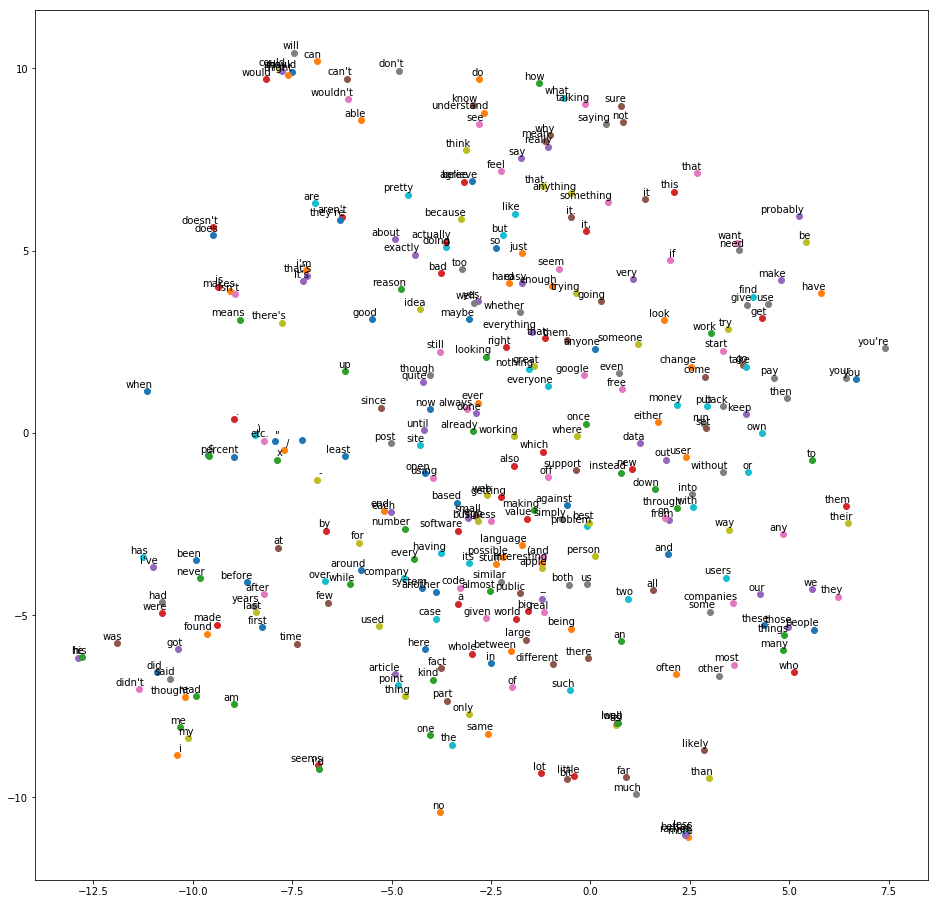

In [31]:
# Creates and plots t-SNE Model
def tsne_plot(model):
    labels = []
    tokens = []

    for word in model.wv.vocab:
        tokens.append(model[word])
        labels.append(word)
    
    tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(16, 16)) 
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()
    
tsne_plot(model)

/home/alara/anaconda3/envs/nlp/lib/python3.6/site-packages/ipykernel_launcher.py:7: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  import sys


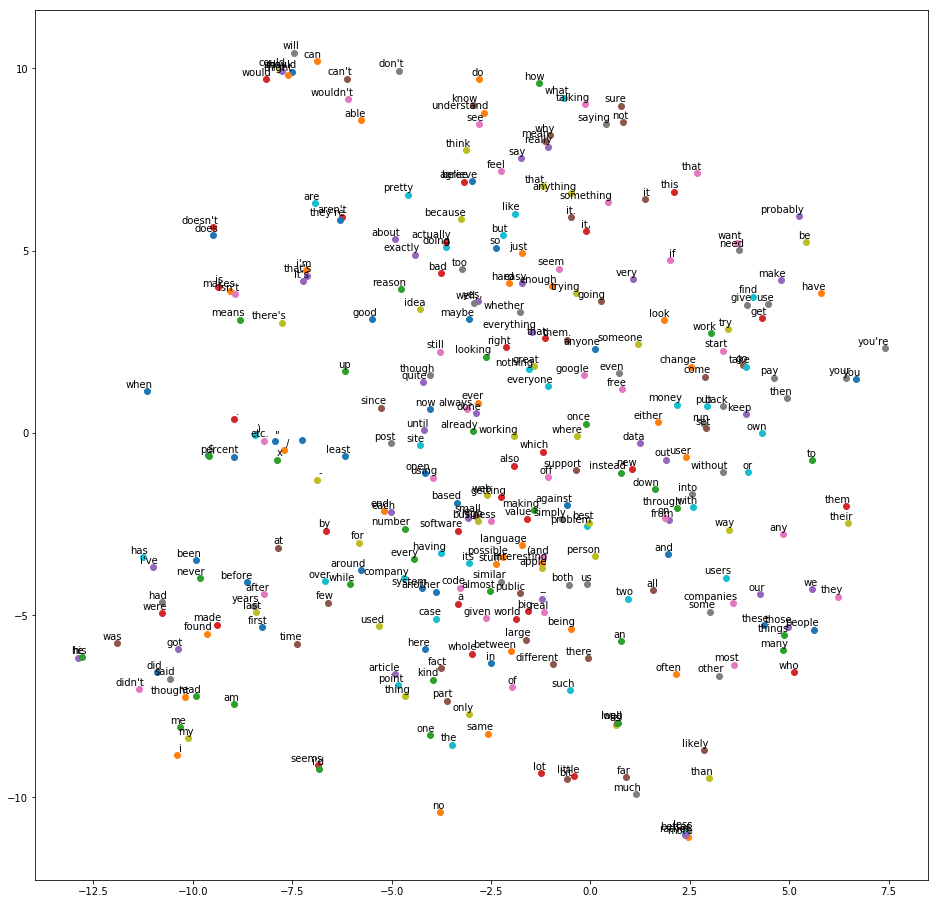

In [26]:
tsne_plot(model)

/home/alara/anaconda3/envs/nlp/lib/python3.6/site-packages/ipykernel_launcher.py:7: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  import sys


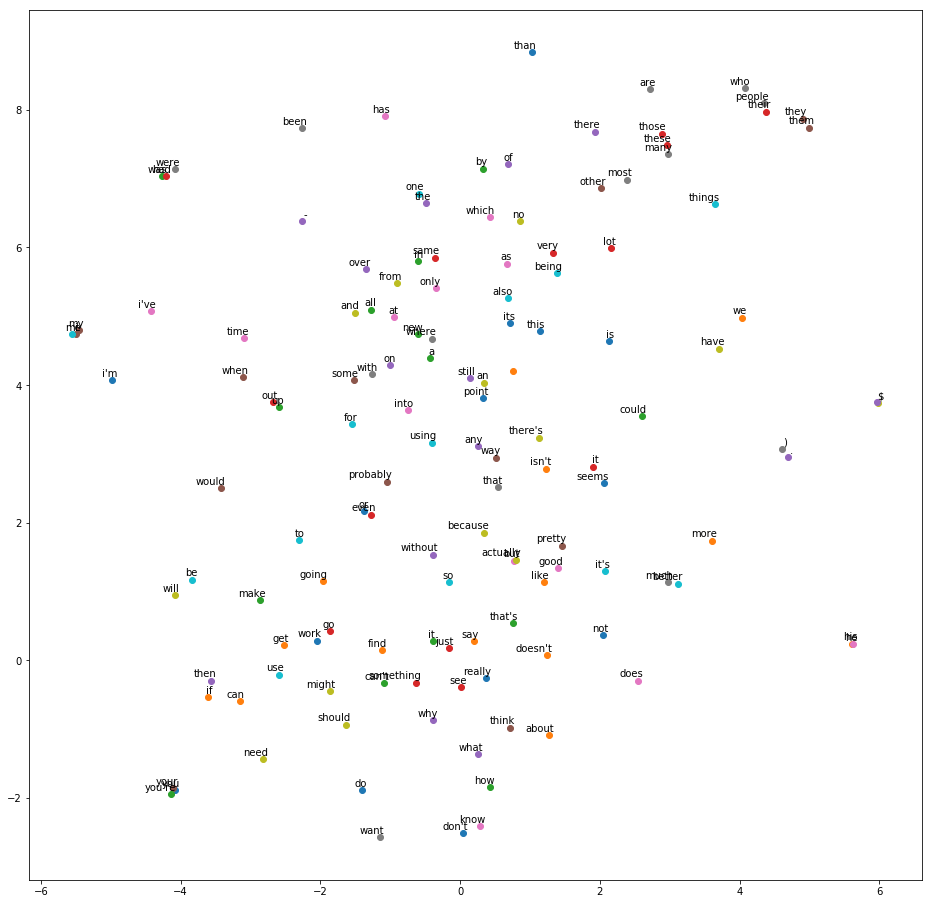

In [32]:
# A more selective model
model = word2vec.Word2Vec(corpus, size=100, window=20, min_count=500, workers=4)
tsne_plot(model)

In [34]:
model.most_similar('want')

/home/alara/anaconda3/envs/nlp/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.
/home/alara/anaconda3/envs/nlp/lib/python3.6/site-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('do', 0.8877506256103516),
 ("can't", 0.8653086423873901),
 ('just', 0.8439922332763672),
 ("don't", 0.8385878801345825),
 ('need', 0.8098489046096802),
 ('it.', 0.7794426083564758),
 ('find', 0.751447319984436),
 ('so', 0.7258598804473877),
 ('work', 0.7206112146377563),
 ('going', 0.7205260992050171)]